In [1]:
import pandas as pd
import xarray as xr
import numpy as np
import dask

import matplotlib as mpl
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.feature import NaturalEarthFeature

from myfunc import mysom, mytrack, myfunc
import os
%config InlineBackend.figure_format='retina'

In [2]:
# Parameters
projectdir = '/rcfs/projects/windpower_wfip2uq/liuy351/Tracer'
met_extent    = [-120, -70, 15, 50]
track_extent  = [-97, -93, 28, 32]
som_extent    = [-105, -90, 26, 37]
pcptypes  = ["Total", "MCS", "IDC", "TC", "NC"]

figdir = './som_fig'
os.makedirs(figdir, exist_ok=True)

# Controlling variables
flag_mkdata=False
year1 = 2004
year2 = 2017

In [3]:
mapsize = (2,2)
pcptype = 'mcs'
season  = 'JJA'
factor  =('u','v','q')

In [4]:
def prepare_met(var, vname, year, season, tracks, mapsize, bmu, level=None):

    time = tracks["time"].dt.floor("H")
    time = np.unique(np.array(time))

    if level is None:
        clm = xr.open_dataset(f"met/{var}_{season}.nc")[vname]
    else:    
        clm = xr.open_dataset(f"met/{var}{level}_{season}.nc")[vname]
    met = clm.sel(time=time)
    fill = clm.isel(time=0)*np.nan

    #...split data based on bmu
    # print(met)
    # print(bmu.data)
    # print(mapsize)
    met_clusters, met_cluster_mean, met_pct = mysom.calc_cluster_mapsize(met, bmu, mapsize=mapsize)
    ano = []; pval = []; mean = [];
    for i, met_cluster in enumerate(met_clusters):
        del met_cluster.coords["bmu"]
        ano_, pval_, mean_, clm_mean_ = myfunc.two_sample_diff(met_cluster, clm)
        ano.append(ano_)
        pval.append(pval_)
        mean.append(mean_)
    ano = xr.concat(ano, dim="som")
    pval= xr.concat(pval, dim="som")
    mean= xr.concat(mean, dim="som")
    mean= mean.assign_attrs(pct=met_pct)
    return met_clusters, ano, pval, mean, met_pct

def save_data(ano, pval, mean, var, year, season, pcptype):
    fname = f"som/SOM_{pcptype}_{var}_{year[0]}-{year[1]}_{season}.nc"
    xr.merge([ano.rename(f"{var}_ano"),
              pval.rename(f"{var}_pval"),
              mean.rename(f"{var}_mean")]).to_netcdf(fname)
    
def load_data(var, year, season, pcptype):
    fname = f"som/SOM_{pcptype}_{var}_{year[0]}-{year[1]}_{season}.nc"
    ds    = xr.open_dataset(fname)
    return ds[f"{var}_ano"], ds[f"{var}_pval"], ds[f"{var}_mean"], ds[f"{var}_mean"].attrs["pct"]

In [5]:
Ano, Pval, Mean, PCT = {}, {}, {}, {}
for season in ['MAM', 'JJA', 'SON', 'DJF']:
    for pcptype in ['mcs', 'idc']:
        if flag_mkdata:
            fname_bmu = mysom.bmu_filename(mapsize, factor, season, pcptype)
            bmu  = mysom.read_bmu(fname_bmu, season, pcptype=pcptype, flag_swap=True, flag_cluster=False)
            outname = mytrack.create_outname(f"{pcptype}_location", (year1,year2))
            tracks  = mytrack.load_data_idc(outname, (year1,year2), season)#, extent=track_extent)
            track_clusters = mysom.calc_cluster_track_mapsize(tracks, bmu, mapsize=mapsize)
            q_clusters, q_ano, q_pval, q_mean, pct = prepare_met("q", "Q", (year1,year2), season, tracks, mapsize, bmu, level=925)
            z_clusters, z_ano, z_pval, z_mean, _   = prepare_met("z", "Z", (year1,year2), season, tracks, mapsize, bmu, level=500)
            u_clusters, u_ano, u_pval, u_mean, _   = prepare_met("u", "U", (year1,year2), season, tracks, mapsize, bmu, level=925)
            v_clusters, v_ano, v_pval, v_mean, _   = prepare_met("v", "V", (year1,year2), season, tracks, mapsize, bmu, level=925)
            w_clusters, w_ano, w_pval, w_mean, _   = prepare_met("w", "W", (year1,year2), season, tracks, mapsize, bmu, level=500)
            t2_clusters,t2_ano,t2_pval,t2_mean,_   = prepare_met("t2", "VAR_2T", (year1,year2), season, tracks, mapsize, bmu)

            save_data(q_ano, q_pval, q_mean, "q925", (year1,year2), season, pcptype)
            save_data(z_ano, z_pval, z_mean, "z500", (year1,year2), season, pcptype)
            save_data(u_ano, u_pval, u_mean, "u925", (year1,year2), season, pcptype)
            save_data(v_ano, v_pval, v_mean, "v925", (year1,year2), season, pcptype)
            save_data(w_ano, w_pval, w_mean, "v500", (year1,year2), season, pcptype)
            save_data(t2_ano,t2_pval,t2_mean,"2m",   (year1,year2), season, pcptype)

        else:
            q_ano, q_pval, q_mean, pct =  load_data("q925", (year1,year2), season, pcptype)
            z_ano, z_pval, z_mean, _   =  load_data("z500", (year1,year2), season, pcptype)
            u_ano, u_pval, u_mean, _   =  load_data("u925", (year1,year2), season, pcptype)
            v_ano, v_pval, v_mean, _   =  load_data("v925", (year1,year2), season, pcptype)
            w_ano, w_pval, w_mean, _   =  load_data("w500", (year1,year2), season, pcptype)
            t2_ano,t2_pval,t2_mean,_   =  load_data("2m",   (year1,year2), season, pcptype)

        Ano[q_ano.name+f'_{season}_{pcptype}']   = q_ano
        Pval[q_pval.name+f'_{season}_{pcptype}'] = q_pval
        Mean[q_mean.name+f'_{season}_{pcptype}'] = q_mean
        PCT[f'{season}_{pcptype}']  = pct
        Ano[z_ano.name+f'_{season}_{pcptype}']   = z_ano
        Pval[z_pval.name+f'_{season}_{pcptype}'] = z_pval
        Mean[z_mean.name+f'_{season}_{pcptype}'] = z_mean
        Ano[u_ano.name+f'_{season}_{pcptype}']   = u_ano
        Pval[u_pval.name+f'_{season}_{pcptype}'] = u_pval
        Mean[u_mean.name+f'_{season}_{pcptype}'] = u_mean
        Ano[v_ano.name+f'_{season}_{pcptype}']   = v_ano
        Pval[v_pval.name+f'_{season}_{pcptype}'] = v_pval
        Mean[v_mean.name+f'_{season}_{pcptype}'] = v_mean
        Ano[t2_ano.name+f'_{season}_{pcptype}']  = t2_ano
        Pval[t2_pval.name+f'_{season}_{pcptype}']= t2_pval
        Mean[t2_mean.name+f'_{season}_{pcptype}']= t2_mean
        Ano[w_ano.name+f'_{season}_{pcptype}']  = w_ano
        Pval[w_pval.name+f'_{season}_{pcptype}']= w_pval
        Mean[w_mean.name+f'_{season}_{pcptype}']= w_mean        


In [6]:
psfc = xr.open_dataset('../ERA5/sp/sp.2004.sfc.mean.nc')['SP'].squeeze()/100.
psfc = psfc.sel(latitude=q_mean.latitude, longitude=q_mean.longitude)
psfc

<xarray.DataArray 'SP' (latitude: 141, longitude: 201)>
array([[1012.72986, 1012.63104, 1012.7717 , ..., 1013.27893, 1013.4835 ,
        1013.62305],
       [1012.8608 , 1012.7826 , 1012.8425 , ..., 1013.1381 , 1013.1138 ,
        1013.4148 ],
       [1012.8974 , 1012.89764, 1012.91516, ..., 1013.5746 , 1013.5747 ,
        1013.6128 ],
       ...,
       [ 855.9596 ,  882.20026,  894.1614 , ...,  955.77875,  954.76276,
         956.96484],
       [ 855.1463 ,  886.57587,  898.4779 , ...,  959.0291 ,  958.02045,
         957.3362 ],
       [ 863.63385,  894.76935,  904.2883 , ...,  952.91174,  953.28485,
         952.55005]], dtype=float32)
Coordinates:
    time       datetime64[ns] 2004-07-16T11:00:00
  * longitude  (longitude) float64 240.0 240.2 240.5 240.8 ... 289.5 289.8 290.0
  * latitude   (latitude) float64 15.0 15.25 15.5 15.75 ... 49.5 49.75 50.0
    level      float64 925.0

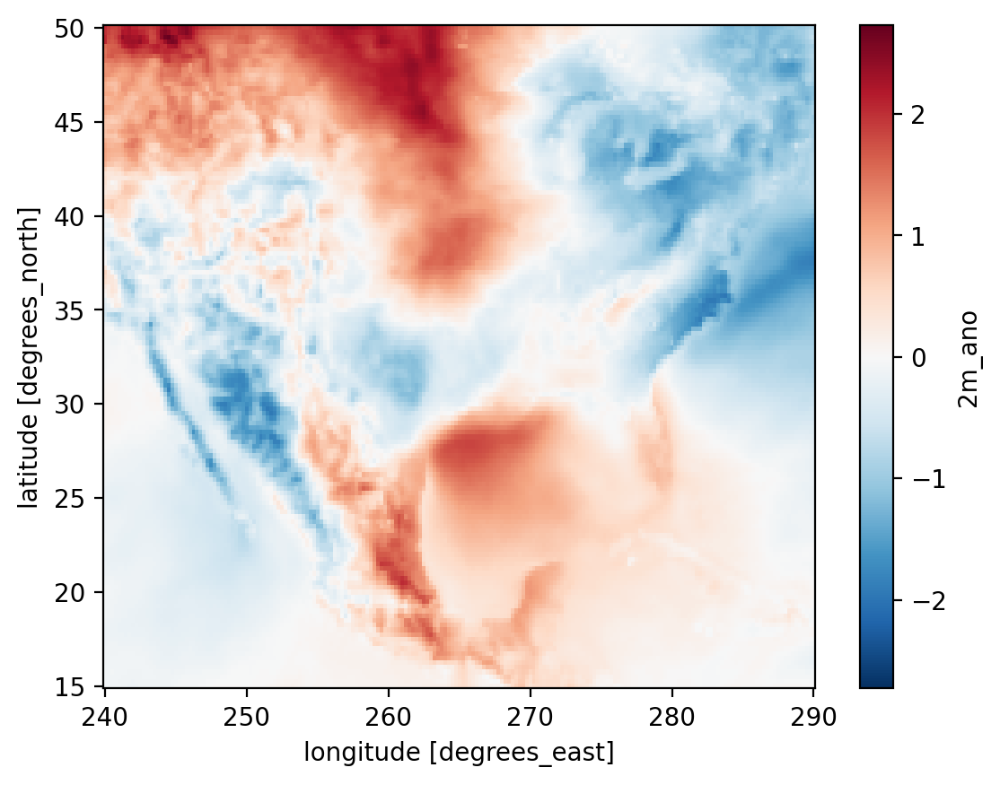

In [7]:
t2_ano.isel(som=3).plot()

In [8]:
PCT

{'MAM_mcs': array([27.37430168, 22.90502793, 21.7877095 , 27.93296089]),
 'MAM_idc': array([30.15721772, 19.86660314, 26.9175798 , 23.05859933]),
 'JJA_mcs': array([22.28571429, 27.42857143, 24.57142857, 25.71428571]),
 'JJA_idc': array([34.17183927, 16.66122182, 15.69748448, 33.46945443]),
 'SON_mcs': array([15.53398058, 33.00970874, 14.5631068 , 36.89320388]),
 'SON_idc': array([26.2745098 , 19.28104575, 23.92156863, 30.52287582]),
 'DJF_mcs': array([27.5 , 28.75, 21.25, 22.5 ]),
 'DJF_idc': array([31.97815534, 20.63106796, 29.55097087, 17.83980583])}

In [9]:
Pval.keys()

dict_keys(['q925_pval_MAM_mcs', 'z500_pval_MAM_mcs', 'u925_pval_MAM_mcs', 'v925_pval_MAM_mcs', '2m_pval_MAM_mcs', 'w500_pval_MAM_mcs', 'q925_pval_MAM_idc', 'z500_pval_MAM_idc', 'u925_pval_MAM_idc', 'v925_pval_MAM_idc', '2m_pval_MAM_idc', 'w500_pval_MAM_idc', 'q925_pval_JJA_mcs', 'z500_pval_JJA_mcs', 'u925_pval_JJA_mcs', 'v925_pval_JJA_mcs', '2m_pval_JJA_mcs', 'w500_pval_JJA_mcs', 'q925_pval_JJA_idc', 'z500_pval_JJA_idc', 'u925_pval_JJA_idc', 'v925_pval_JJA_idc', '2m_pval_JJA_idc', 'w500_pval_JJA_idc', 'q925_pval_SON_mcs', 'z500_pval_SON_mcs', 'u925_pval_SON_mcs', 'v925_pval_SON_mcs', '2m_pval_SON_mcs', 'w500_pval_SON_mcs', 'q925_pval_SON_idc', 'z500_pval_SON_idc', 'u925_pval_SON_idc', 'v925_pval_SON_idc', '2m_pval_SON_idc', 'w500_pval_SON_idc', 'q925_pval_DJF_mcs', 'z500_pval_DJF_mcs', 'u925_pval_DJF_mcs', 'v925_pval_DJF_mcs', '2m_pval_DJF_mcs', 'w500_pval_DJF_mcs', 'q925_pval_DJF_idc', 'z500_pval_DJF_idc', 'u925_pval_DJF_idc', 'v925_pval_DJF_idc', '2m_pval_DJF_idc', 'w500_pval_DJF_idc

In [10]:
for season in ['MAM', 'JJA', 'SON', 'DJF']:
    for pcptype in ['mcs', 'idc']:
        for vname in ['q925', 'z500', 'u925', 'v925','2m','w500']:
            Ano[f'{vname}_ano_pval_{season}_{pcptype}'] = Ano[f'{vname}_ano_{season}_{pcptype}'].where(Pval[f'{vname}_pval_{season}_{pcptype}']<0.05)
        

In [11]:
from yllib.plot import plot_map
import cartopy.crs as ccrs
def plot_on_map(data, u=None, v=None, u1=None, v1=None, **kwargs):
    mpl.rcParams['font.size'] = 15
    mpl.rcParams['font.family'] = 'Helvetica'  

    if (fig:=kwargs.get('fig')) is None:  
        fig = plt.figure(figsize=(8, 5))
    if (ax:=kwargs.get('ax')) is None:  ax = plt.axes()
    ax.set_axis_on()
    
    plot_map.set_map(
        ax,
        extent=met_extent,
        gridlines_kw=dict(
            xticks=[-110,-100,-90,-80],
            yticks=[25,35,45],
            linestyle=":", alpha=0.3,
        ),
        gridlabels_kw=dict(
            xticks=[-110,-100,-90,-80] if kwargs.get('drawxlabel', False) else [],
            yticks=[25,35,45] if kwargs.get('drawylabel', False) else [],
        ),
        boundary_kw=dict(
            coastline_kw=dict(linewidth=1.2, alpha=0.8, color='k'),
        ),
    )
    plot_map.add_rectangle(ax, track_extent, zorder=5)
    plot_map.add_rectangle(ax, [-110, -80, 20, 45], ec="k", lw=2, zorder=5)
    
    if kwargs.get('mask_psfc', True):
        data = data.where(psfc>925)
    lon, lat = data["longitude"], data["latitude"]
    
    # draw contourf
    cmap = kwargs.get('cmap', "WhiteBlueGreenYellowRed")
    clev = kwargs.get('clev', np.arange(0, 40, 1))
    cs, clev = plot_map.add_contourf(
        ax, lon, lat, data,
        cmap=cmap,clev=clev,
    )
    
    # draw vector
    if u is not None:
        u = u.where(psfc>925)
        v = v.where(psfc>925)
        u = u[::10,::10]
        v = v[::10,::10]
        lon, lat = u["longitude"], u["latitude"]
        flag_draw_qk    = kwargs.get("flag_draw_qk", False)
        vector_kwargs = dict(scale=20, color='tab:gray')
        vector_kwargs.update(kwargs.get('vector_kwargs', {}))
        vplot = plot_map.add_vector(
            ax, lon, lat, u, v, 
            vector_kwargs=vector_kwargs,
        )
        
    # draw vector
    if u1 is not None:
        u1 = u1.where(psfc>925)
        v1 = v1.where(psfc>925)
        u = u1[::10,::10]
        v = v1[::10,::10]
        lon, lat = u["longitude"], u["latitude"]
        flag_draw_qk    = kwargs.get("flag_draw_qk", False)
        vector_kwargs = dict(scale=20, color='purple', width=0.006)
        vector_kwargs.update(kwargs.get('vector_kwargs', {}))
        vplot = plot_map.add_vector(
            ax, lon, lat, u, v, 
            vector_kwargs=vector_kwargs,
        )
    
    if (odata:=kwargs.get('overlay')) is not None:
        lon, lat = odata["longitude"], odata["latitude"]
        oclev = kwargs.get('overlay_clev')
        ocs, oclev = plot_map.add_contour(
            ax, lon, lat, odata,
            colors='k',clev=oclev,linewidths=0.8,
        )       
        ax.clabel(
            ocs,  # Typically best results when labelling line contours.
            colors=['k'],
            manual=False,  # Automatic placement vs manual placement.
            inline=True,  # Cut the line where the label will be placed.
            fmt=' {:.0f} '.format,  # Labes as integers, with some extra space.
            fontsize=10,
        )    
    
    # mcs, mclev = plot_map.add_contour(
    #     ax, lon, lat, psfc,
    #     colors='green',clev=[925],linewidths=0.8,
    # )     
    
    if kwargs.get('draw_colorbar'):
        plot_map.add_colorbar(cs, ax, clev[::10])
        
    if u is not None: 
        return cs, clev, vplot
    else:
        return cs, clev

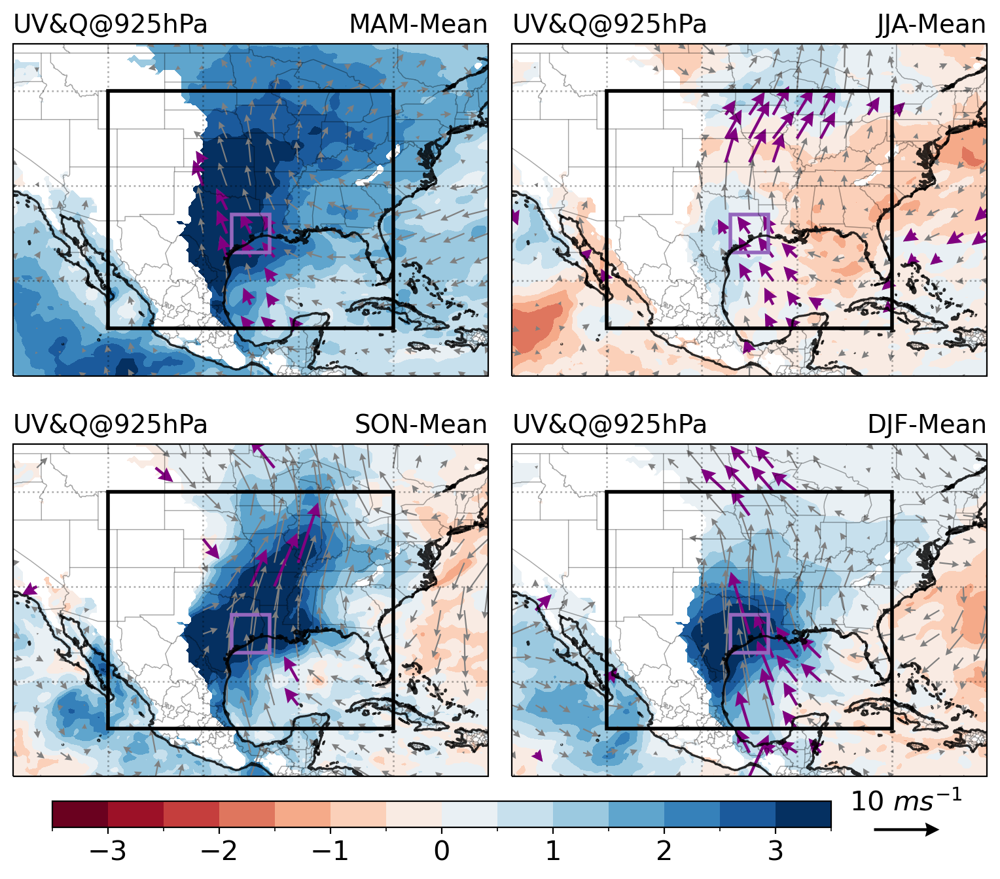

In [12]:
fig, axs = plt.subplots(
    2, 2, figsize=(8, 7), 
    sharex=True, sharey=True, 
    subplot_kw={'projection': ccrs.PlateCarree()}
)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
axs = axs.ravel()
abcd = list('abcdefghijklmnop')
for ax in axs: ax.set_axis_off()

cnt = 0
cmap = "MPL_RdBu"
clev = [-1000]+list(np.linspace(-3,3,13))+[1000]
for i, season in enumerate(['MAM', 'JJA', 'SON', 'DJF']):
    ax = axs[cnt]
    cs, clev, vplot = plot_on_map(
        Ano[f'q925_ano_{season}_mcs'].isel(som=0), Ano[f'u925_ano_{season}_mcs'].isel(som=0), Ano[f'v925_ano_{season}_mcs'].isel(som=0),
        Ano[f'u925_ano_pval_{season}_mcs'].isel(som=0), Ano[f'v925_ano_pval_{season}_mcs'].isel(som=0),
        fig=fig, ax=ax,
        cmap=cmap, clev=clev, alpha=0.5
    )
    ax.set_title(f'{season}-Mean', loc='right', fontsize=14)
    ax.set_title(f'UV&Q@925hPa', loc='left', fontsize=14)

    cnt += 1

plot_map.add_colorbar(
    cs, axs, clev[1:-1:2],
    orientation='horizontal', 
    aspect=30, shrink=0.8,
    pad=0.03, anchor=(0.2, 1.0)
)
plot_map.add_quiverkey(axs[-1], vplot, length=10, labelpos='N')

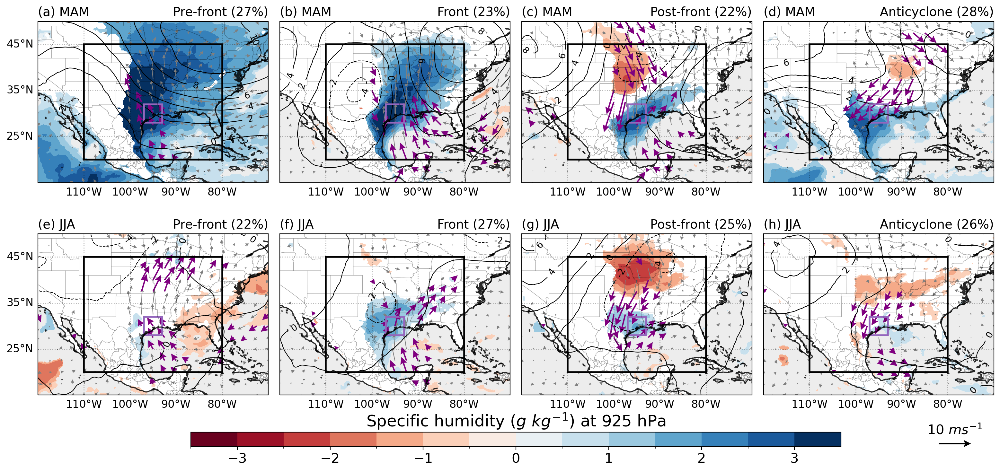

In [26]:
somtype = ['Pre-front', 'Front', 'Post-front', 'Anticyclone']
fig, axs = plt.subplots(
    2, 4, figsize=(16, 8), 
    sharex=True, sharey=True, 
    subplot_kw={'projection': ccrs.PlateCarree()}
)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
axs = axs.ravel()
abcd = list('abcdefghijklmnop')
for ax in axs: ax.set_axis_off()

cnt = 0
cmap = "MPL_RdBu"
clev = [-1000]+list(np.linspace(-3,3,13))+[1000]

for season in ['MAM', 'JJA']:
    for i in np.arange(4):
        ax = axs[cnt]
        cs, clev, vplot = plot_on_map(
            Ano[f'q925_ano_pval_{season}_mcs'].isel(som=i), Ano[f'u925_ano_{season}_mcs'].isel(som=i), Ano[f'v925_ano_{season}_mcs'].isel(som=i),
            Ano[f'u925_ano_pval_{season}_mcs'].isel(som=i), Ano[f'v925_ano_pval_{season}_mcs'].isel(som=i),
            fig=fig, ax=ax,
            cmap=cmap, clev=clev, alpha=0.5,
            drawylabel=True if i==0 else False, drawxlabel=True,
            # overlay=Mean[f'z500_mean_{season}_mcs'].isel(som=i),
            # overlay_clev=[540,550,560,570,580,590,600],
            overlay=Ano[f'z500_ano_{season}_mcs'].isel(som=i)-2 if (i==0)&(season=='MAM') else Ano[f'z500_ano_{season}_mcs'].isel(som=i),
            overlay_clev=[-10,-8,-6,-4,-2,0,2,4,6,8,10],
        )
        _pct = PCT[f'{season}_mcs'][i]
        ax.set_title(f'{somtype[i]} ({_pct:.0f}%)', loc='right', fontsize=14)
        ax.set_title(f'({abcd[cnt]}) {season}', loc='left', fontsize=14)

        cnt += 1

ccs = plot_map.add_colorbar(
    cs, axs, clev[1:-1:2],
    orientation='horizontal', 
    aspect=45, shrink=0.68,
    pad=0.08, anchor=(0.5, 1.0)
)
ccs.ax.set_title('Specific humidity ($g\ kg^{-1}$) at 925 hPa')

plot_map.add_quiverkey(ccs.ax, vplot, x=0.83, y=-0.30, length=10, labelpos='N')
fig.savefig('paper/Figure6.pdf', bbox_inches='tight')
fig.savefig('paper/Figure6.png', format='png', bbox_inches='tight', dpi=300)


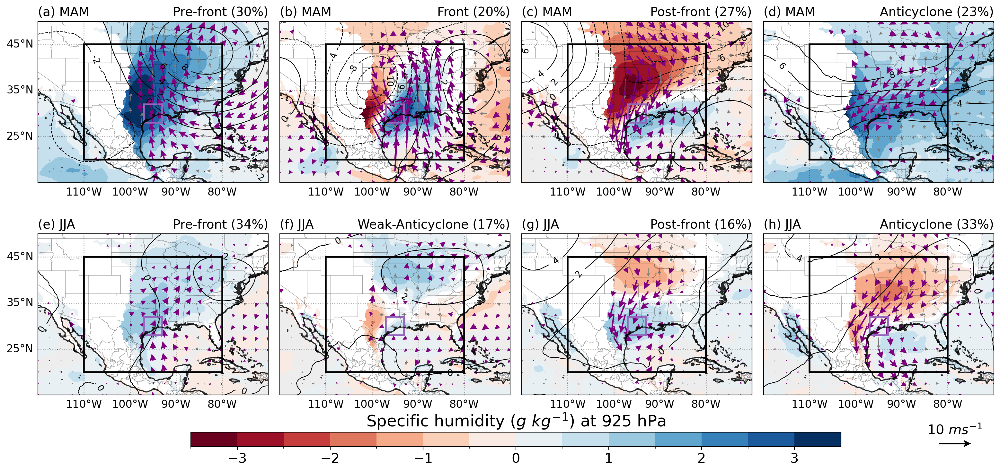

In [25]:
somtype_mam = ['Pre-front', 'Front', 'Post-front', 'Anticyclone']
somtype_jja = ['Pre-front', 'Weak-Anticyclone', 'Post-front', 'Anticyclone']
fig, axs = plt.subplots(
    2, 4, figsize=(16, 8), 
    sharex=True, sharey=True, 
    subplot_kw={'projection': ccrs.PlateCarree()}
)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
axs = axs.ravel()
abcd = list('abcdefghijklmnop')
for ax in axs: ax.set_axis_off()

cnt = 0
cmap = "MPL_RdBu"
clev = [-1000]+list(np.linspace(-3,3,13))+[1000]

for season in ['MAM', 'JJA']:
    if season=='MAM': somtype = somtype_mam
    if season=='JJA': somtype = somtype_jja
    for i in np.arange(4):
        ax = axs[cnt]
        cs, clev, vplot = plot_on_map(
            Ano[f'q925_ano_pval_{season}_idc'].isel(som=i), Ano[f'u925_ano_{season}_idc'].isel(som=i), Ano[f'v925_ano_{season}_idc'].isel(som=i),
            Ano[f'u925_ano_pval_{season}_idc'].isel(som=i), Ano[f'v925_ano_pval_{season}_idc'].isel(som=i),
            fig=fig, ax=ax,
            cmap=cmap, clev=clev, alpha=0.5,
            drawylabel=True if i==0 else False, drawxlabel=True,
            overlay=Ano[f'z500_ano_{season}_idc'].isel(som=i)-2 if (i==0)&(season=='MAM') else Ano[f'z500_ano_{season}_idc'].isel(som=i),
            overlay_clev=[-10,-8,-6,-4,-2,0,2,4,6,8,10],
        )
        _pct = PCT[f'{season}_idc'][i]
        ax.set_title(f'{somtype[i]} ({_pct:.0f}%)', loc='right', fontsize=14)
        ax.set_title(f'({abcd[cnt]}) {season}', loc='left', fontsize=14)

        cnt += 1

ccs = plot_map.add_colorbar(
    cs, axs, clev[1:-1:2],
    orientation='horizontal', 
    aspect=45, shrink=0.68,
    pad=0.08, anchor=(0.5, 1.0)
)
ccs.ax.set_title('Specific humidity ($g\ kg^{-1}$) at 925 hPa')

plot_map.add_quiverkey(ccs.ax, vplot, x=0.83, y=-0.30, length=10, labelpos='N')
fig.savefig('paper/Figure7.pdf', bbox_inches='tight')
fig.savefig('paper/Figure7.png', format='png', bbox_inches='tight', dpi=300)


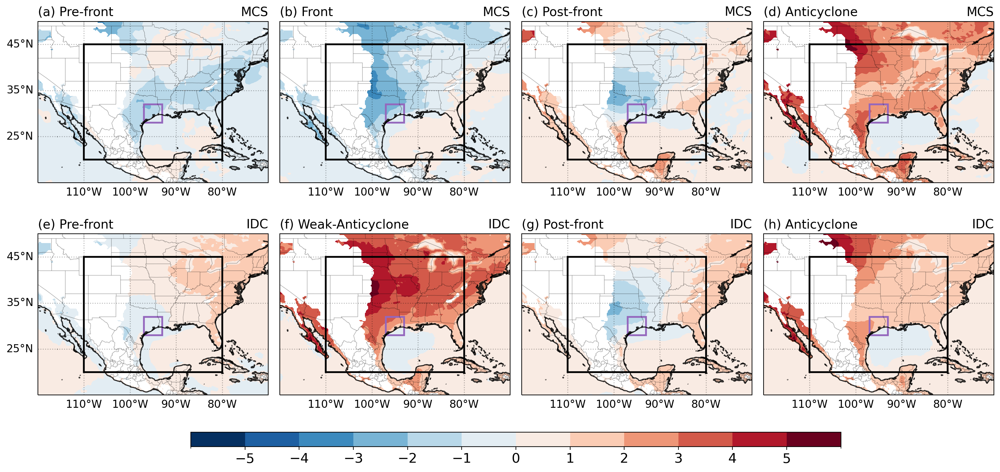

In [15]:
somtype_mam = ['Pre-front', 'Front', 'Post-front', 'Anticyclone']
somtype_jja = ['Pre-front', 'Weak-Anticyclone', 'Post-front', 'Anticyclone']
fig, axs = plt.subplots(
    2, 4, figsize=(16, 8), 
    sharex=True, sharey=True, 
    subplot_kw={'projection': ccrs.PlateCarree()}
)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
axs = axs.ravel()
abcd = list('abcdefghijklmnop')
for ax in axs: ax.set_axis_off()

cnt = 0
cmap = "MPL_RdBu_r"
clev = [-1000]+list(np.linspace(-5,5,11))+[1000]

season = 'JJA'
for pretype in ['mcs', 'idc']:
    if pretype=='mcs': somtype = somtype_mam
    if pretype=='idc': somtype = somtype_jja
    for i in np.arange(4):
        ax = axs[cnt]
        cs, clev = plot_on_map(
            Ano[f'2m_ano_JJA_{pretype}'].isel(som=i),
            fig=fig, ax=ax,
            cmap=cmap, clev=clev, alpha=0.5,
            drawylabel=True if i==0 else False, drawxlabel=True,
        )
        ax.set_title(f'({abcd[cnt]}) {somtype[i]}', loc='left', fontsize=14)
        ax.set_title(f'{pretype.upper()}', loc='right', fontsize=14)

        cnt += 1

ccs = plot_map.add_colorbar(
    cs, axs, clev[1:-1:1],
    orientation='horizontal', 
    aspect=45, shrink=0.68,
    pad=0.08, anchor=(0.5, 1.0)
)
# ccs.ax.set_title('Anomalous wind vector ($m\ s^{-1}$) and specific humidity ($g\ kg^{-1}$) at 925 hPa')

# plot_map.add_quiverkey(ccs.ax, vplot, x=0.83, y=-0.30, length=10, labelpos='N')

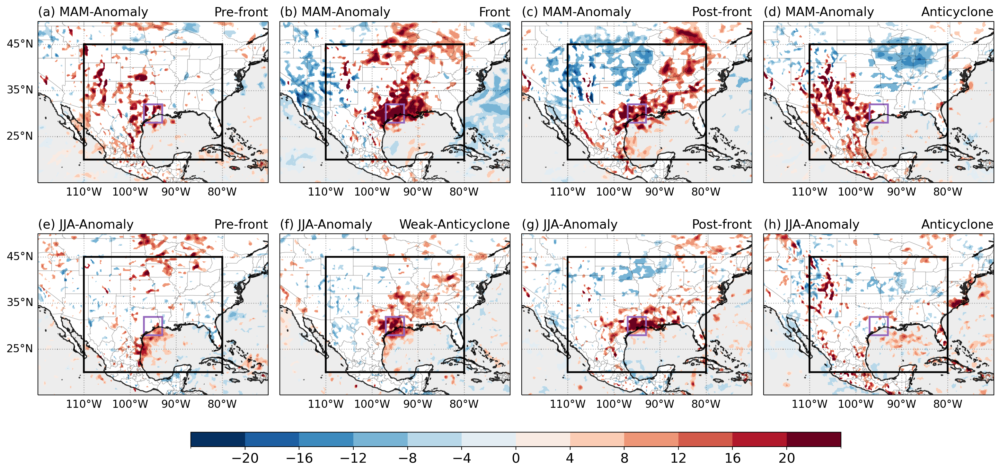

In [24]:
for season in ['MAM', 'JJA', 'SON', 'DJF']:
    for pcptype in ['mcs', 'idc']:
        for vname in ['w500']:
            Ano[f'{vname}_ano_pval_{season}_{pcptype}'] = Ano[f'{vname}_ano_{season}_{pcptype}'].where(Pval[f'{vname}_pval_{season}_{pcptype}']<0.2)
            
somtype_mam = ['Pre-front', 'Front', 'Post-front', 'Anticyclone']
somtype_jja = ['Pre-front', 'Weak-Anticyclone', 'Post-front', 'Anticyclone']
fig, axs = plt.subplots(
    2, 4, figsize=(16, 8), 
    sharex=True, sharey=True, 
    subplot_kw={'projection': ccrs.PlateCarree()}
)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
axs = axs.ravel()
abcd = list('abcdefghijklmnop')
for ax in axs: ax.set_axis_off()

cnt = 0
cmap = "MPL_RdBu_r"
clev = [-1000]+list(np.linspace(-20,20,11))+[1000]

pretype = 'mcs'
for season in ['MAM', 'JJA']:
    if season=='MAM': somtype = somtype_mam
    if season=='JJA': somtype = somtype_jja
    for i in np.arange(4):
        ax = axs[cnt]
        cs, clev = plot_on_map(
            Ano[f'w500_ano_pval_{season}_{pretype}'].isel(som=i)*-100,
            fig=fig, ax=ax,
            cmap=cmap, clev=clev, alpha=0.5,
            mask_psfc=False,
            drawylabel=True if i==0 else False, drawxlabel=True,
        )
        ax.set_title(f'{somtype[i]}', loc='right', fontsize=14)
        ax.set_title(f'({abcd[cnt]}) {season}-Anomaly', loc='left', fontsize=14)
        
        cnt += 1

ccs = plot_map.add_colorbar(
    cs, axs, clev[1:-1:1],
    orientation='horizontal', 
    aspect=45, shrink=0.68,
    pad=0.08, anchor=(0.5, 1.0)
)
# ccs.ax.set_title('Anomalous wind vector ($m\ s^{-1}$) and specific humidity ($g\ kg^{-1}$) at 925 hPa')

# plot_map.add_quiverkey(ccs.ax, vplot, x=0.83, y=-0.30, length=10, labelpos='N')
fig.savefig('paper/Figure8.pdf', format='pdf', bbox_inches='tight')
fig.savefig('paper/Figure8.png', format='png', bbox_inches='tight', dpi=300)


In [16]:
Ano.keys()

dict_keys(['q925_ano_MAM_mcs', 'z500_ano_MAM_mcs', 'u925_ano_MAM_mcs', 'v925_ano_MAM_mcs', '2m_ano_MAM_mcs', 'w500_ano_MAM_mcs', 'q925_ano_MAM_idc', 'z500_ano_MAM_idc', 'u925_ano_MAM_idc', 'v925_ano_MAM_idc', '2m_ano_MAM_idc', 'w500_ano_MAM_idc', 'q925_ano_JJA_mcs', 'z500_ano_JJA_mcs', 'u925_ano_JJA_mcs', 'v925_ano_JJA_mcs', '2m_ano_JJA_mcs', 'w500_ano_JJA_mcs', 'q925_ano_JJA_idc', 'z500_ano_JJA_idc', 'u925_ano_JJA_idc', 'v925_ano_JJA_idc', '2m_ano_JJA_idc', 'w500_ano_JJA_idc', 'q925_ano_SON_mcs', 'z500_ano_SON_mcs', 'u925_ano_SON_mcs', 'v925_ano_SON_mcs', '2m_ano_SON_mcs', 'w500_ano_SON_mcs', 'q925_ano_SON_idc', 'z500_ano_SON_idc', 'u925_ano_SON_idc', 'v925_ano_SON_idc', '2m_ano_SON_idc', 'w500_ano_SON_idc', 'q925_ano_DJF_mcs', 'z500_ano_DJF_mcs', 'u925_ano_DJF_mcs', 'v925_ano_DJF_mcs', '2m_ano_DJF_mcs', 'w500_ano_DJF_mcs', 'q925_ano_DJF_idc', 'z500_ano_DJF_idc', 'u925_ano_DJF_idc', 'v925_ano_DJF_idc', '2m_ano_DJF_idc', 'w500_ano_DJF_idc'])

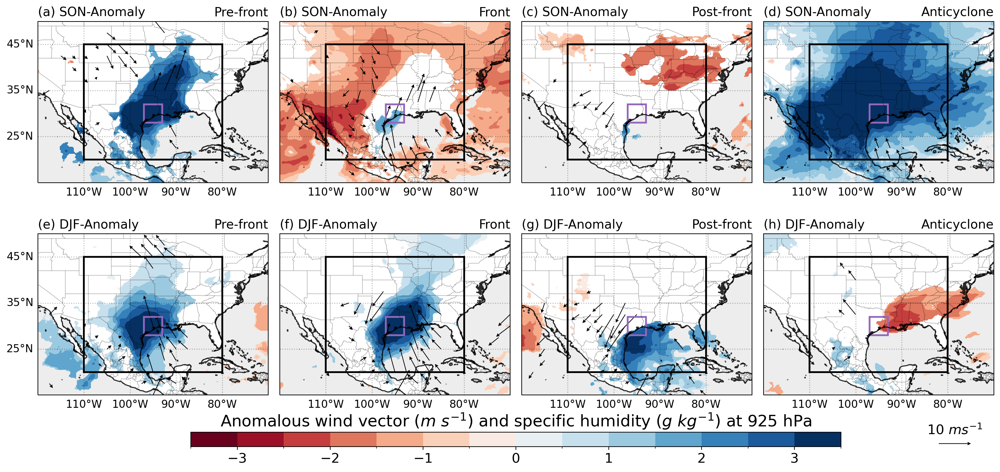

In [17]:
somtype = ['Pre-front', 'Front', 'Post-front', 'Anticyclone']
fig, axs = plt.subplots(
    2, 4, figsize=(16, 8), 
    sharex=True, sharey=True, 
    subplot_kw={'projection': ccrs.PlateCarree()}
)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
axs = axs.ravel()
abcd = list('abcdefghijklmnop')
for ax in axs: ax.set_axis_off()

cnt = 0
cmap = "MPL_RdBu"
clev = [-1000]+list(np.linspace(-3,3,13))+[1000]

for season in ['SON', 'DJF']:
    for i in np.arange(4):
        ax = axs[cnt]
        cs, clev, vplot = plot_on_map(
            Ano[f'q925_ano_{season}_mcs'].isel(som=i), Ano[f'u925_ano_{season}_mcs'].isel(som=i), Ano[f'v925_ano_{season}_mcs'].isel(som=i),
            fig=fig, ax=ax,
            cmap=cmap, clev=clev, alpha=0.5,
            drawylabel=True if i==0 else False, drawxlabel=True,
        )
        ax.set_title(f'{somtype[i]}', loc='right', fontsize=14)
        ax.set_title(f'({abcd[cnt]}) {season}-Anomaly', loc='left', fontsize=14)

        cnt += 1

ccs = plot_map.add_colorbar(
    cs, axs, clev[1:-1:2],
    orientation='horizontal', 
    aspect=45, shrink=0.68,
    pad=0.08, anchor=(0.5, 1.0)
)
ccs.ax.set_title('Anomalous wind vector ($m\ s^{-1}$) and specific humidity ($g\ kg^{-1}$) at 925 hPa')

plot_map.add_quiverkey(ccs.ax, vplot, x=0.83, y=-0.30, length=10, labelpos='N')

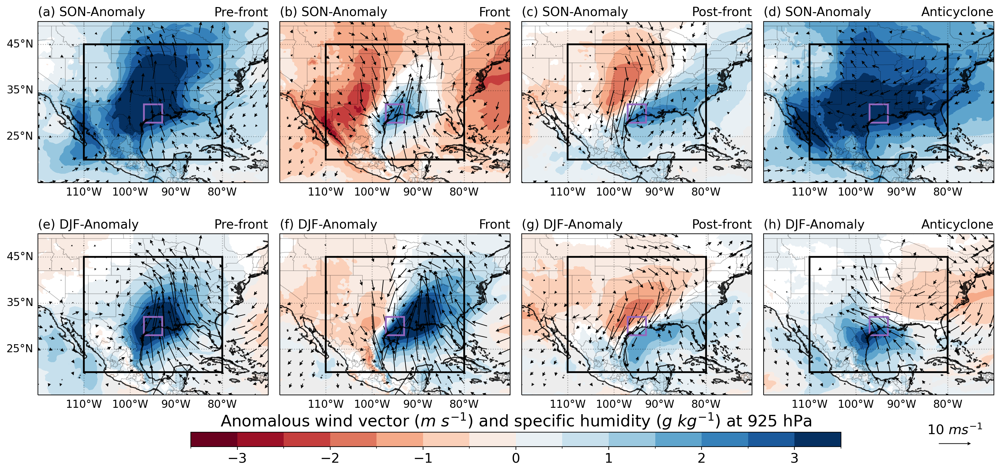

In [18]:
somtype_mam = ['Pre-front', 'Front', 'Post-front', 'Anticyclone']
somtype_jja = ['Pre-front', 'Weak-Anticyclone', 'Post-front', 'Anticyclone']
fig, axs = plt.subplots(
    2, 4, figsize=(16, 8), 
    sharex=True, sharey=True, 
    subplot_kw={'projection': ccrs.PlateCarree()}
)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
axs = axs.ravel()
abcd = list('abcdefghijklmnop')
for ax in axs: ax.set_axis_off()

cnt = 0
cmap = "MPL_RdBu"
clev = [-1000]+list(np.linspace(-3,3,13))+[1000]

for season in ['SON', 'DJF']:
    if season=='MAM': somtype = somtype_mam
    if season=='JJA': somtype = somtype_jja
    for i in np.arange(4):
        ax = axs[cnt]
        cs, clev, vplot = plot_on_map(
            Ano[f'q925_ano_{season}_idc'].isel(som=i), Ano[f'u925_ano_{season}_idc'].isel(som=i), Ano[f'v925_ano_{season}_idc'].isel(som=i),
            fig=fig, ax=ax,
            cmap=cmap, clev=clev, alpha=0.5,
            drawylabel=True if i==0 else False, drawxlabel=True,
        )
        ax.set_title(f'{somtype[i]}', loc='right', fontsize=14)
        ax.set_title(f'({abcd[cnt]}) {season}-Anomaly', loc='left', fontsize=14)

        cnt += 1

ccs = plot_map.add_colorbar(
    cs, axs, clev[1:-1:2],
    orientation='horizontal', 
    aspect=45, shrink=0.68,
    pad=0.08, anchor=(0.5, 1.0)
)
ccs.ax.set_title('Anomalous wind vector ($m\ s^{-1}$) and specific humidity ($g\ kg^{-1}$) at 925 hPa')

plot_map.add_quiverkey(ccs.ax, vplot, x=0.83, y=-0.30, length=10, labelpos='N')

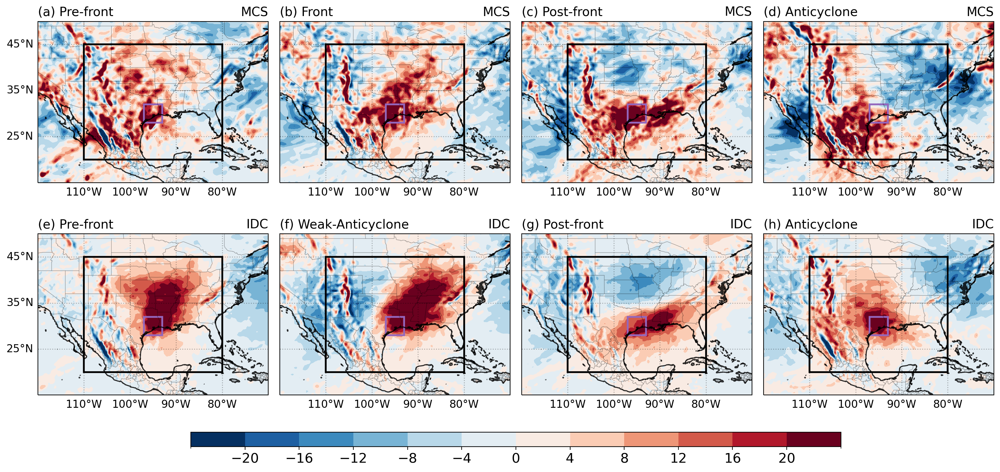

In [19]:
somtype_mam = ['Pre-front', 'Front', 'Post-front', 'Anticyclone']
somtype_jja = ['Pre-front', 'Weak-Anticyclone', 'Post-front', 'Anticyclone']
fig, axs = plt.subplots(
    2, 4, figsize=(16, 8), 
    sharex=True, sharey=True, 
    subplot_kw={'projection': ccrs.PlateCarree()}
)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.98, top=0.95, hspace=0.12, wspace=0.05)
axs = axs.ravel()
abcd = list('abcdefghijklmnop')
for ax in axs: ax.set_axis_off()

cnt = 0
cmap = "MPL_RdBu_r"
clev = [-1000]+list(np.linspace(-20,20,11))+[1000]

season = 'DJF'
for pretype in ['mcs', 'idc']:
    if pretype=='mcs': somtype = somtype_mam
    if pretype=='idc': somtype = somtype_jja
    for i in np.arange(4):
        ax = axs[cnt]
        cs, clev = plot_on_map(
            Ano[f'w500_ano_{season}_{pretype}'].isel(som=i)*-100,
            fig=fig, ax=ax,
            cmap=cmap, clev=clev, alpha=0.5,
            drawylabel=True if i==0 else False, drawxlabel=True,
        )
        ax.set_title(f'({abcd[cnt]}) {somtype[i]}', loc='left', fontsize=14)
        ax.set_title(f'{pretype.upper()}', loc='right', fontsize=14)

        cnt += 1

ccs = plot_map.add_colorbar(
    cs, axs, clev[1:-1:1],
    orientation='horizontal', 
    aspect=45, shrink=0.68,
    pad=0.08, anchor=(0.5, 1.0)
)
# ccs.ax.set_title('Anomalous wind vector ($m\ s^{-1}$) and specific humidity ($g\ kg^{-1}$) at 925 hPa')

# plot_map.add_quiverkey(ccs.ax, vplot, x=0.83, y=-0.30, length=10, labelpos='N')